# preprocessing-unstructured-data-for-llm-applications

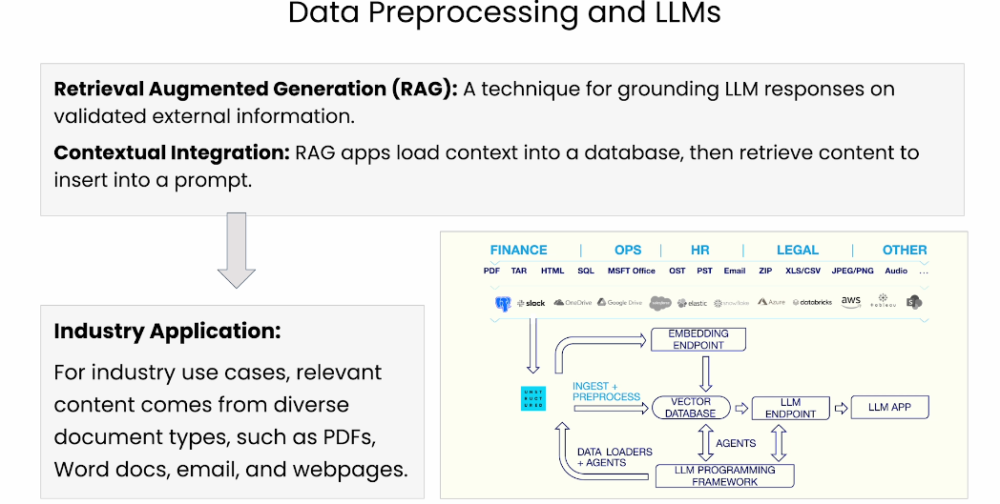

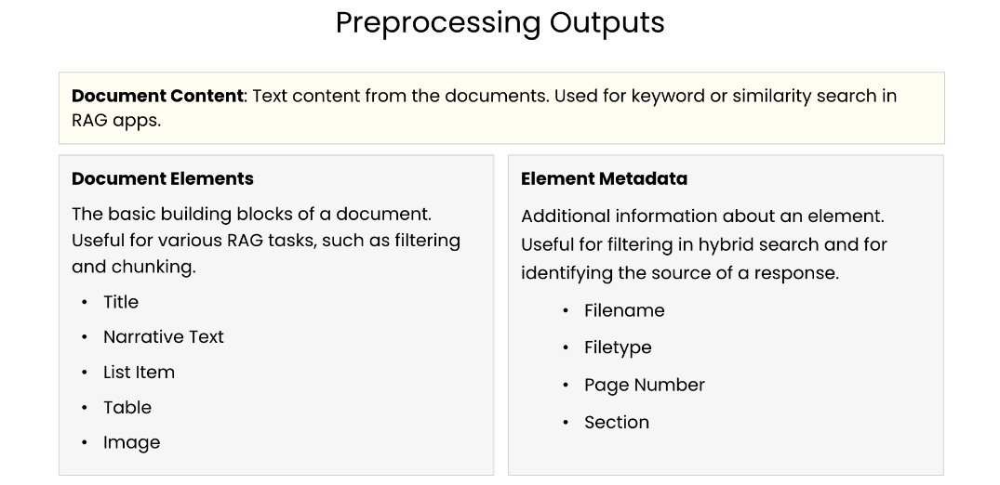

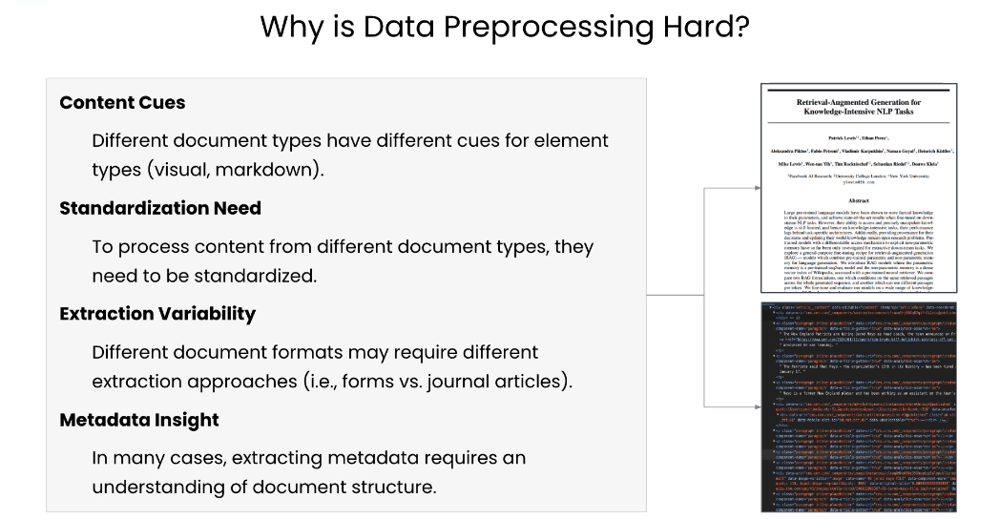

## normalizing-the-content

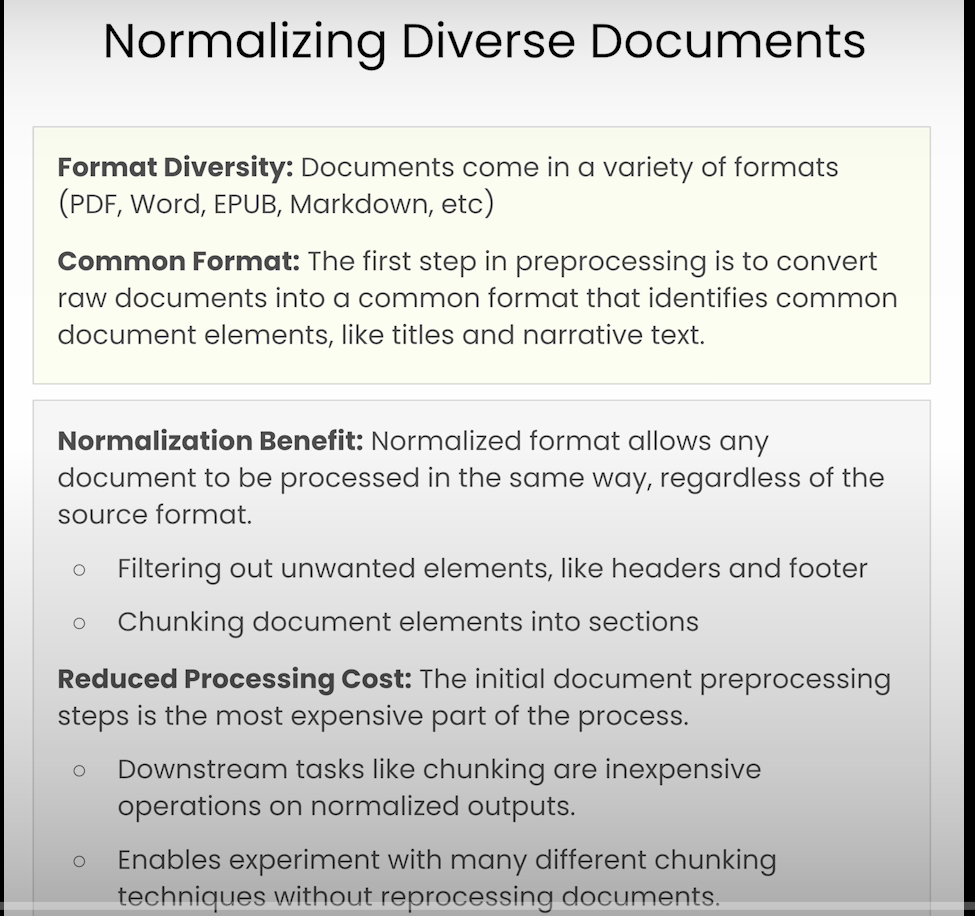

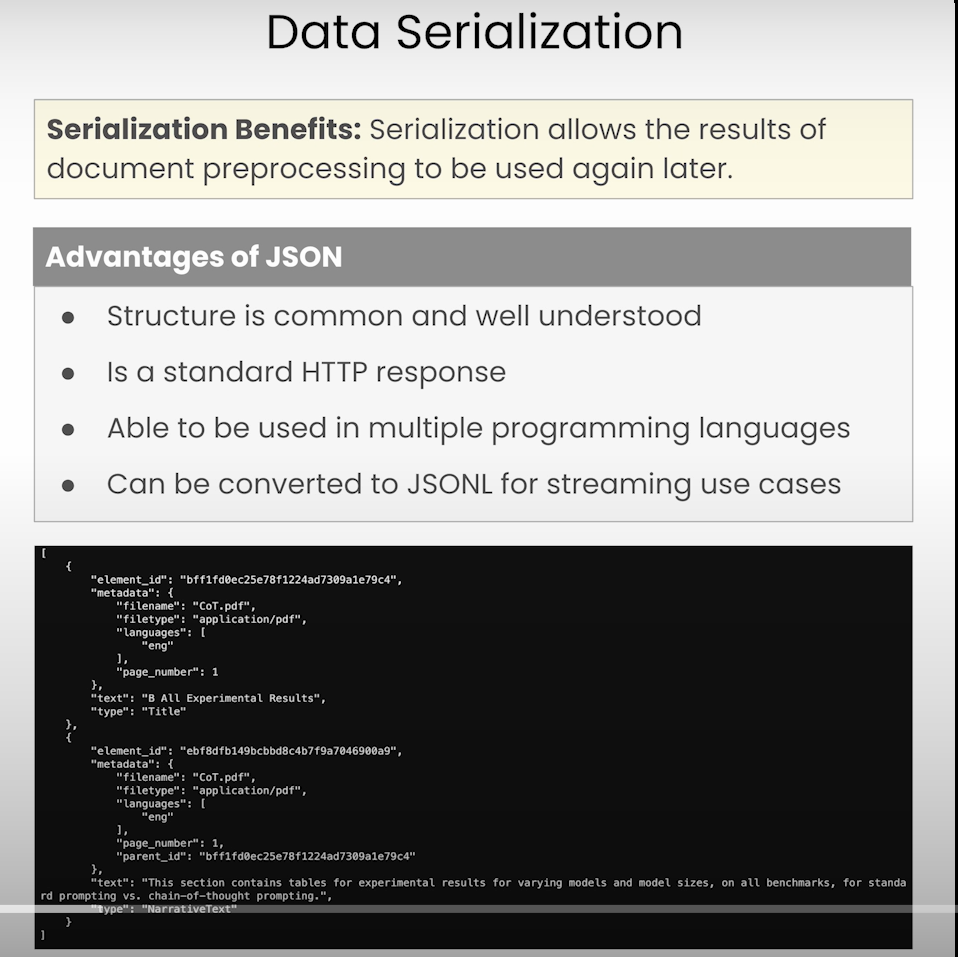

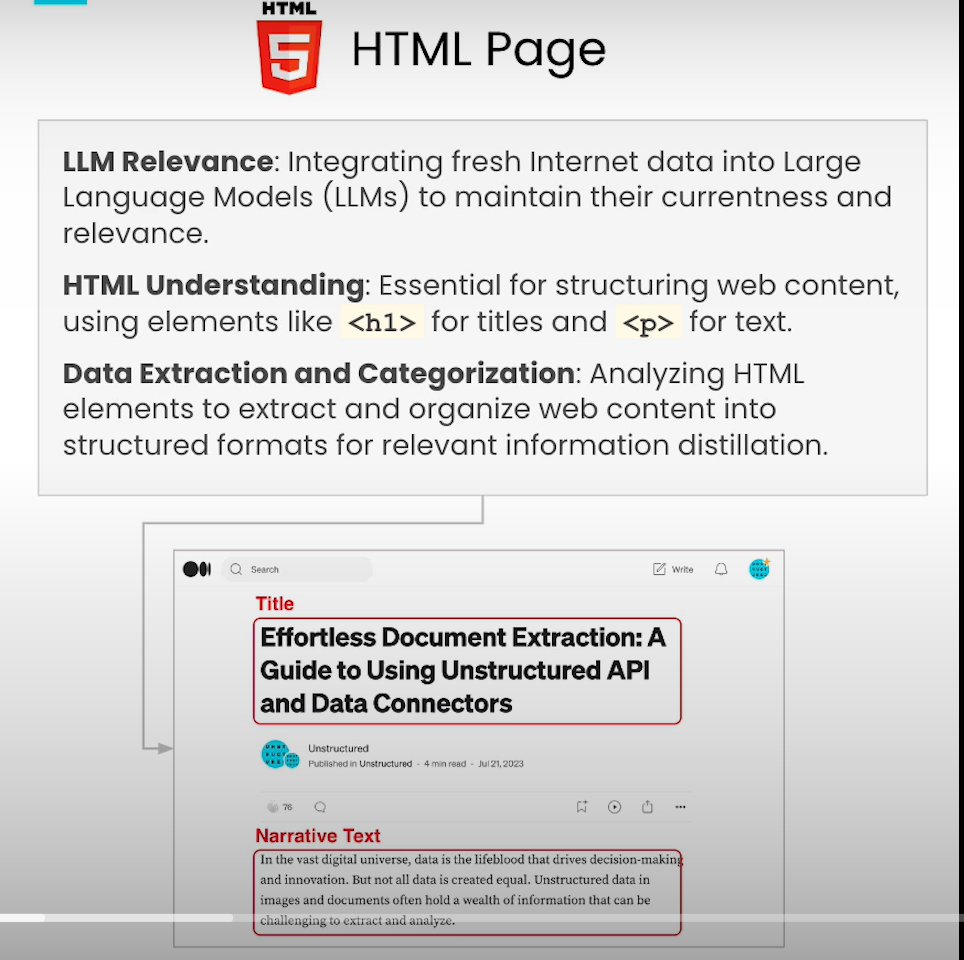

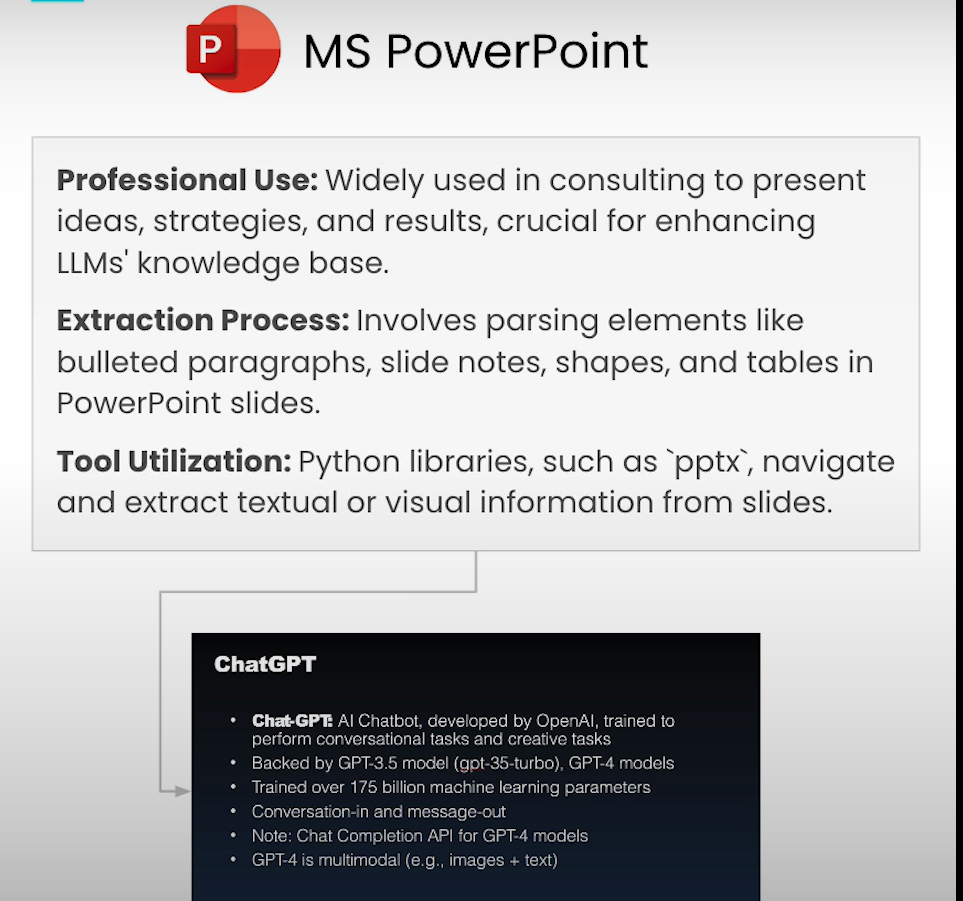

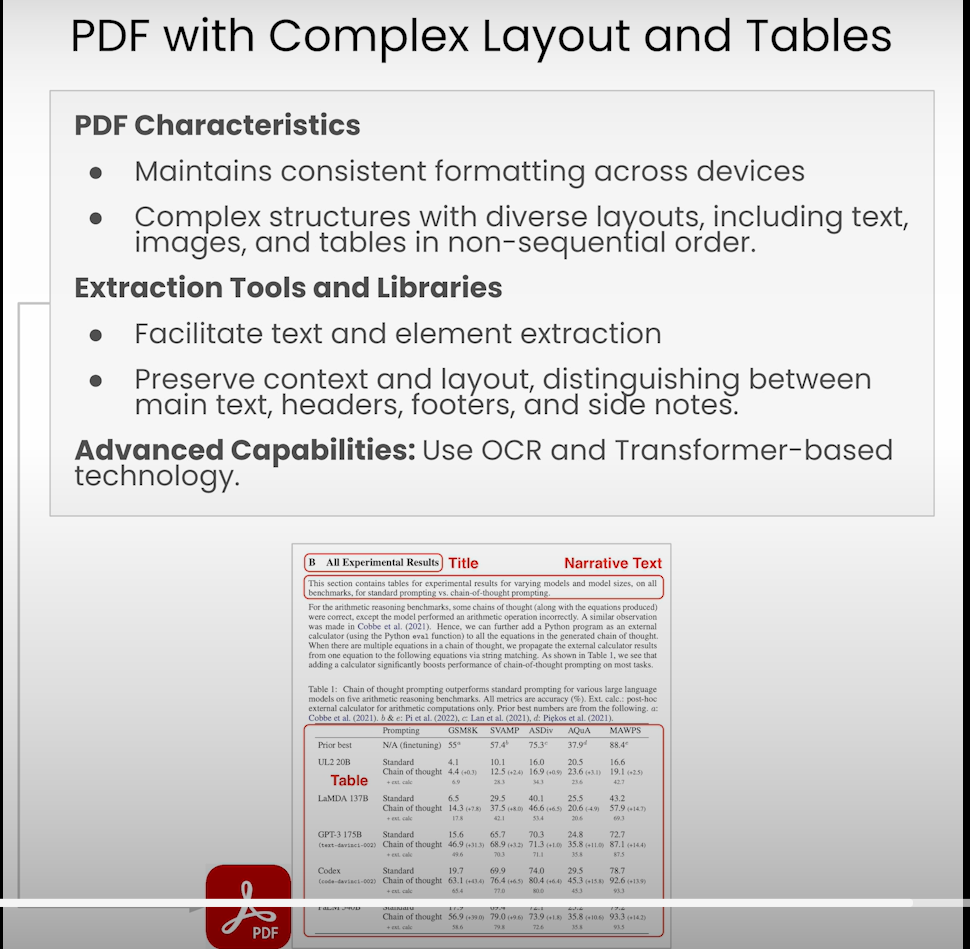

In [1]:
# Warning control
import warnings
warnings.filterwarnings('ignore')

In [4]:
from IPython.display import JSON

import json

from unstructured_client import UnstructuredClient
from unstructured_client.models import shared
from unstructured_client.models.errors import SDKError

from unstructured.partition.html import partition_html
from unstructured.partition.pptx import partition_pptx
from unstructured.staging.base import dict_to_elements, elements_to_json

# HTML Page

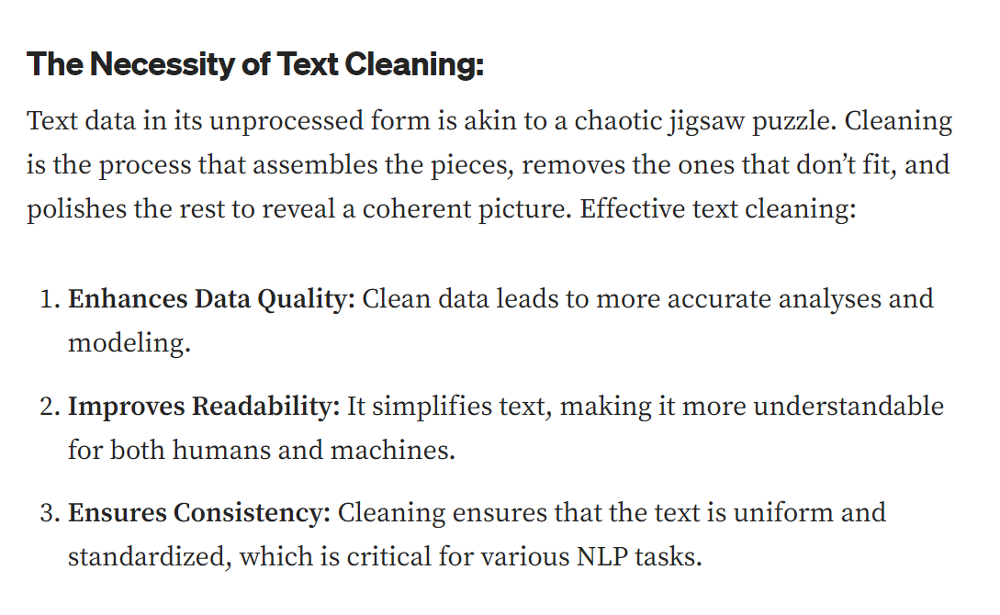

In [14]:
from IPython.display import Image
Image(filename="Data/image1.png", height=600, width=600)

In [11]:
#Save: https://medium.com/@datascientist_SheezaShabbir/text-cleaning-in-nlp-libraries-techniques-and-how-to-get-started-8c7c7e8ba7cf

In [8]:
filename = "Data/A1_Medium.html"
elements = partition_html(filename=filename)

INFO: Reading document from string ...
INFO: Reading document ...


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Abhishek_Jaiswal\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger.zip.


In [9]:
element_dict = [el.to_dict() for el in elements]
example_output = json.dumps(element_dict[11:15], indent=2)
print(example_output)

[
  {
    "type": "Title",
    "element_id": "fe6a7be1ff57ace59ab84975effdb7a1",
    "text": "Data Cleaning",
    "metadata": {
      "category_depth": 0,
      "last_modified": "2024-06-24T20:27:32",
      "link_texts": [
        "Data Cleaning"
      ],
      "link_urls": [
        "https://www.obviously.ai/post/data-cleaning-in-machine-learning"
      ],
      "page_number": 1,
      "languages": [
        "eng"
      ],
      "file_directory": "Data",
      "filename": "A1_Medium.html",
      "filetype": "text/html"
    }
  },
  {
    "type": "NarrativeText",
    "element_id": "f1db6f51e8207b44060b5802c0878e0f",
    "text": "In the realm of Natural Language Processing (NLP), text data is the raw material upon which we perform our linguistic sorcery. However, this raw material is often cluttered with inconsistencies, noise, and irrelevant elements, making it crucial to clean the text data before diving into any NLP analysis. In this comprehensive guide, we\u2019ll explore the librar

In [10]:
JSON(example_output)

<IPython.core.display.JSON object>

# MSFT PowerPoint

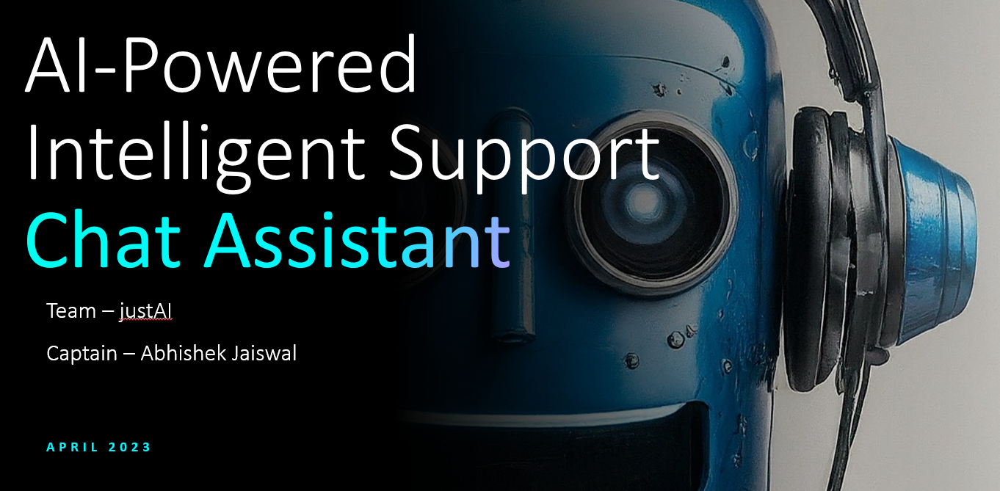

In [16]:
Image(filename="Data/image2.png", height=600, width=600) 

In [17]:
filename = "Data/JustAI_2024.pptx"
elements = partition_pptx(filename=filename)

In [18]:
element_dict = [el.to_dict() for el in elements]
JSON(json.dumps(element_dict[:], indent=2))

<IPython.core.display.JSON object>

# PDF on Chain-of-Thought

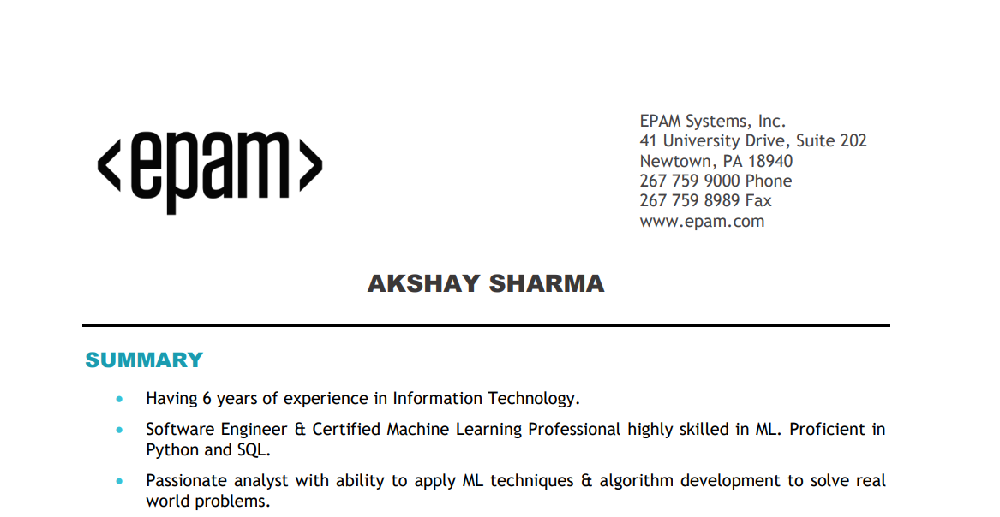

In [19]:
Image(filename="Data/image3.png", height=600, width=600) 

In [ ]:
from Utils import Utils
utils = Utils()

DLAI_API_KEY = utils.get_dlai_api_key()
DLAI_API_URL = utils.get_dlai_url()

s = UnstructuredClient(
    api_key_auth=DLAI_API_KEY,
    server_url=DLAI_API_URL,
)

In [ ]:
filename = "Data/akdata.pdf"
with open(filename, "rb") as f:
    files=shared.Files(
        content=f.read(), 
        file_name=filename,
    )

req = shared.PartitionParameters(
    files=files,
    strategy='hi_res',
    pdf_infer_table_structure=True,
    languages=["eng"],
)
try:
    resp = s.general.partition(req)
    print(json.dumps(resp.elements[:3], indent=2))
except SDKError as e:
    print(e)

In [ ]:
JSON(json.dumps(resp.elements, indent=2))

In [23]:
import fitz  # PyMuPDF

In [26]:
import fitz  # PyMuPDF

# Function to extract text and metadata from PDF
def extract_text_and_metadata_from_pdf(pdf_path):
    # Open the PDF file
    doc = fitz.open(pdf_path)
    
    # Extract metadata
    metadata = doc.metadata
    
    # Extract text from each page
    text = ""
    for page_num in range(len(doc)):
        page = doc.load_page(page_num)
        text += page.get_text()
    
    return text, metadata

# Path to the PDF file
pdf_path = 'Data/akdata.pdf'

# Extract text and metadata
text, metadata = extract_text_and_metadata_from_pdf(pdf_path)

# Print extracted text and metadata
print("Extracted Text:\n", text)
print("\nMetadata:\n", metadata)


Extracted Text:
  
 
 
 
1 
Confidential | May, 2024 
 
 
 
EPAM Systems, Inc. 
41 University Drive, Suite 202 
Newtown, PA 18940 
267 759 9000 Phone 
267 759 8989 Fax 
www.epam.com 
AKSHAY SHARMA 
SUMMARY 
• 
Having 6 years of experience in Information Technology. 
• 
Software Engineer & Certified Machine Learning Professional highly skilled in ML. Proficient in 
Python and SQL.  
• 
Passionate analyst with ability to apply ML techniques & algorithm development to solve real 
world problems. 
Skills and Awards: 
• 
Database Management, Data Analysis, ML Algorithms, Statistical Modeling, Data Modeling and 
Evaluation, Data Visualization, Data Mining, Clustering & Classification. 
• 
Language: Python, SQL 
• 
Tools: INFORM, CLMM, JUPYTER, DMW, SQL Server, Oracle LSH 
• 
Python IDE: Anaconda, Google Colaboratory 
• 
RDBMS Tools: Oracle SQL Developer, MS SQL Server, Teradata, Amazon s3 
Machine Learning And Deep Learning Skills 
• 
Supervised Learning: Generalised Linear Models (Linear/Lo

In [15]:
#Work With Your Own Files

In [ ]:
import panel as pn
#import param
from Utils import upld_file
pn.extension()

In [ ]:
upld_widget = upld_file()
pn.Row(upld_widget.widget_file_upload)

In [ ]:
!ls ./example_files

# metadata-extraction-and-chunking

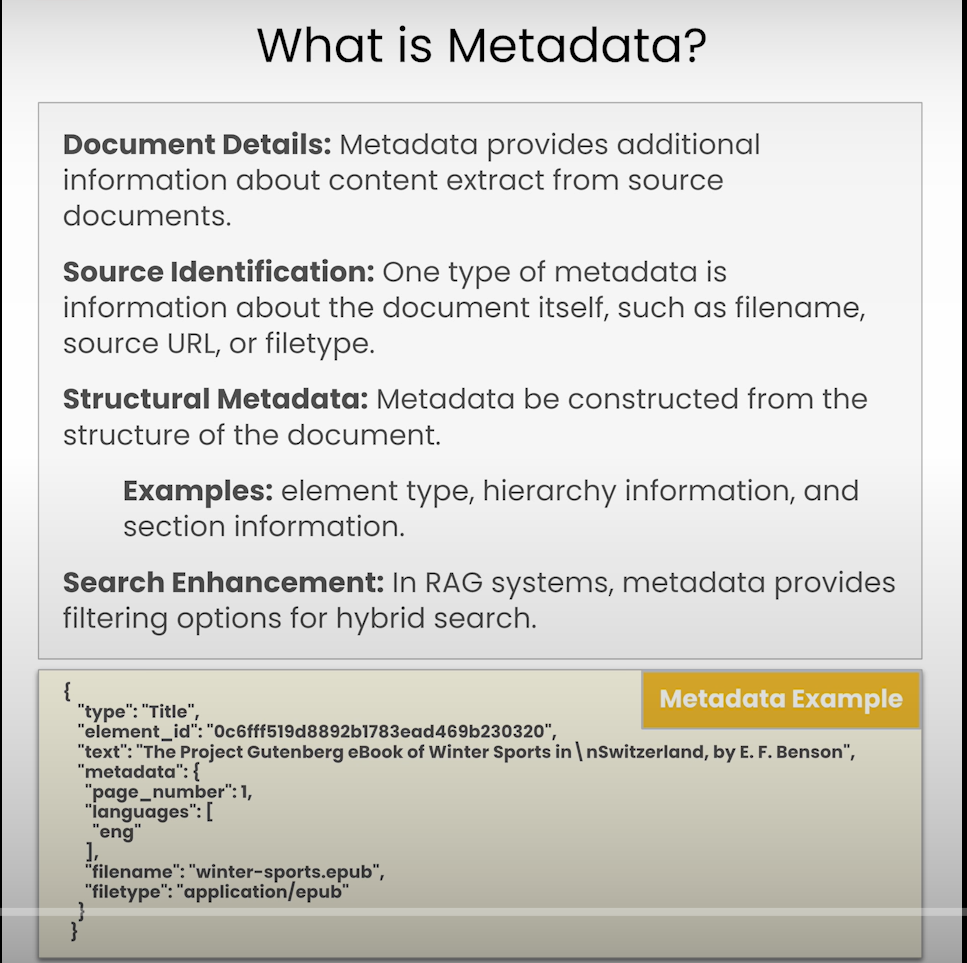

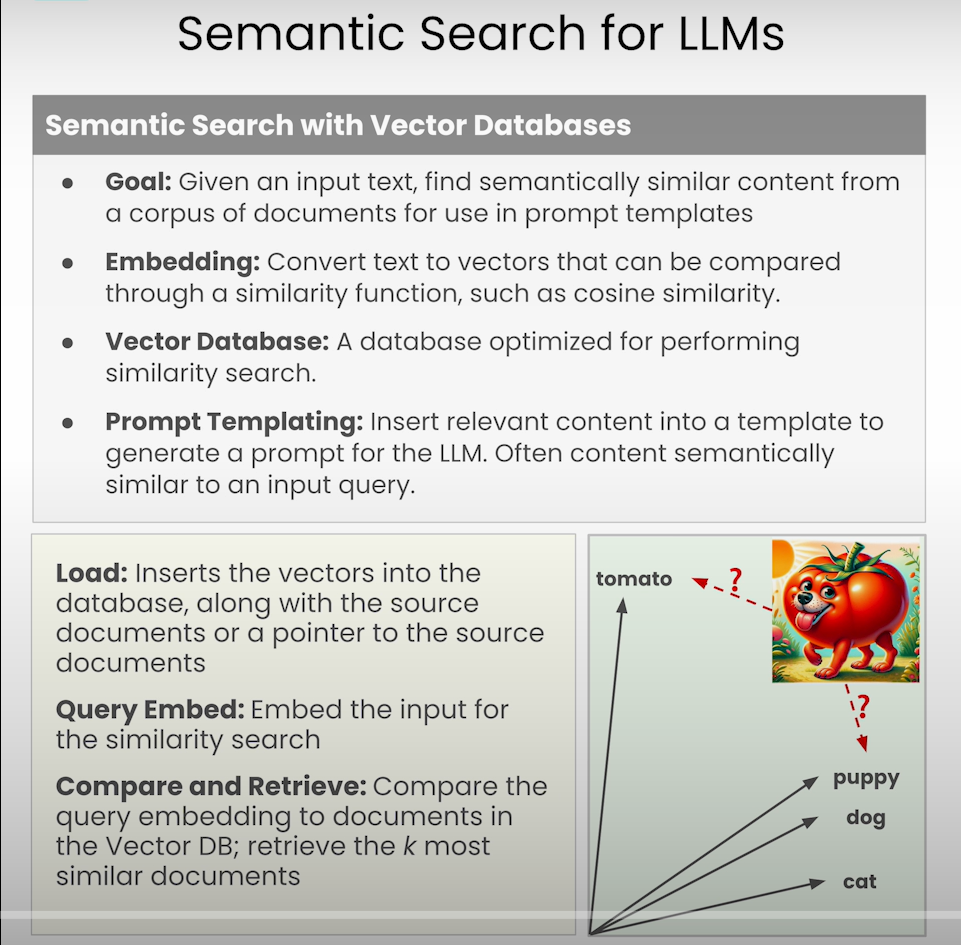

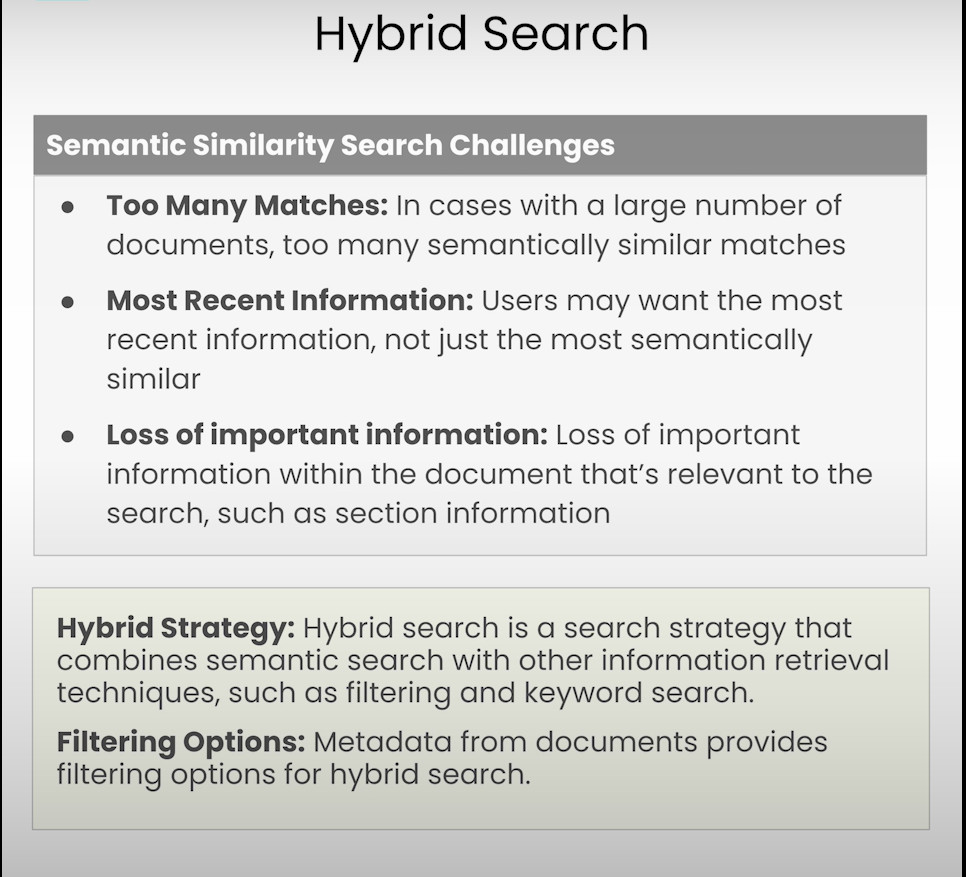

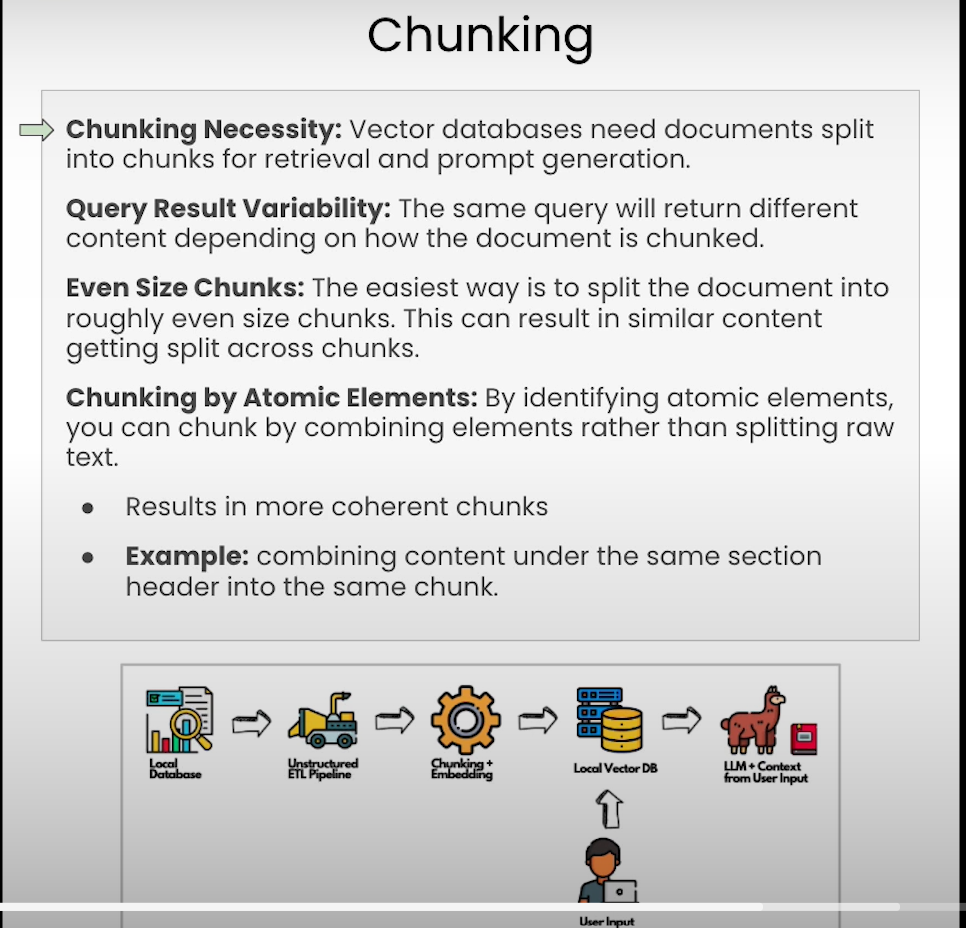

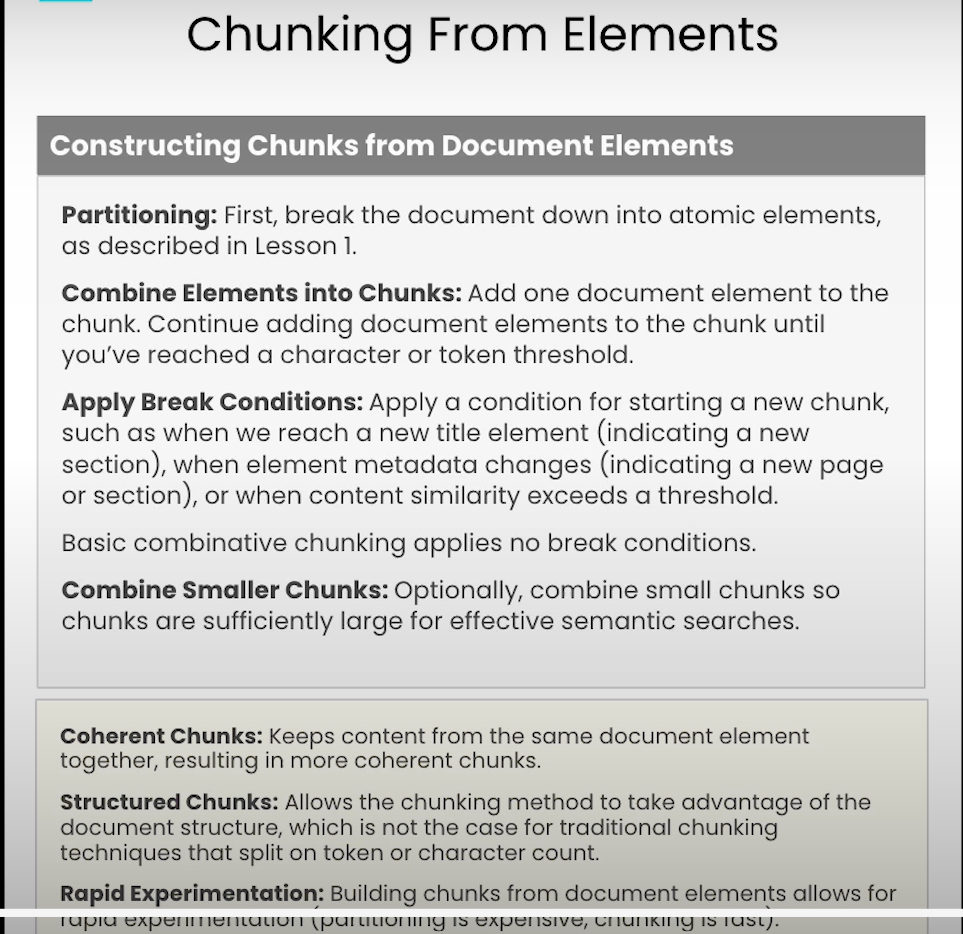

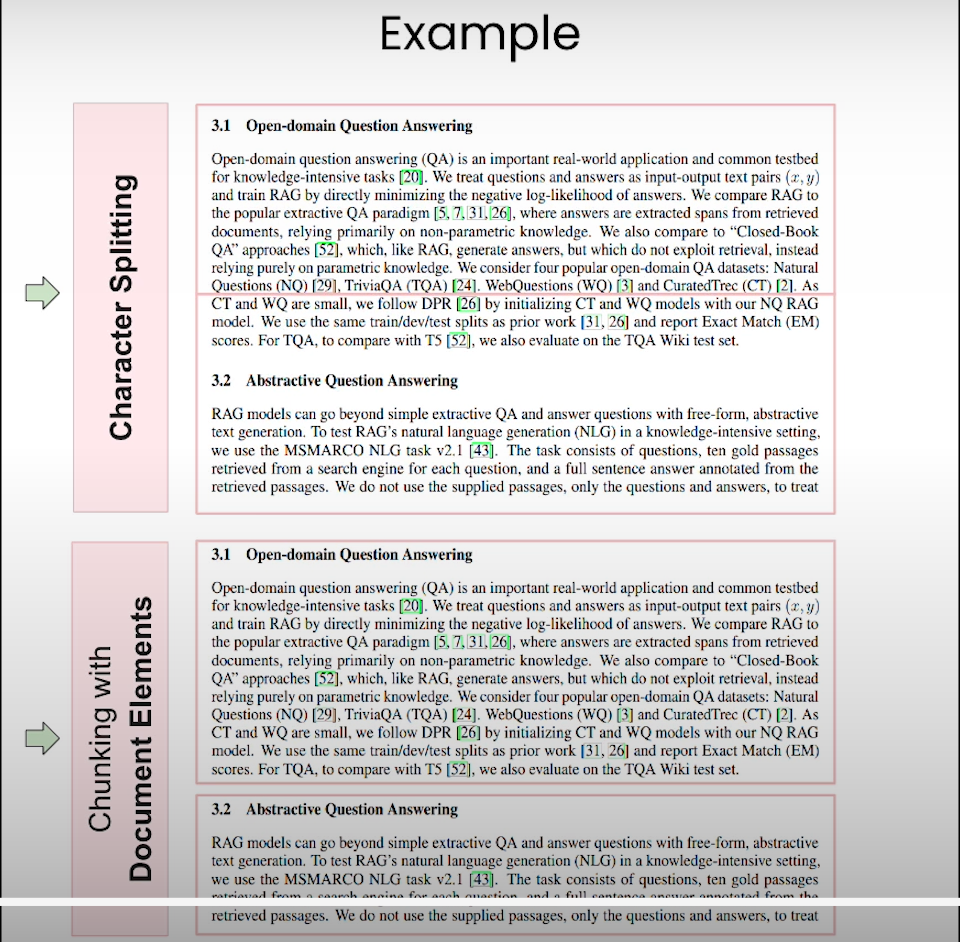

In [31]:
#Note
# https://unstructured.io/api-key-free
# https://docs.unstructured.io/welcome
# API Key: FVcWIC1fEbbJxmx98kLHUeLJFZFOPy

In [27]:
# Warning control
import warnings
warnings.filterwarnings('ignore')

In [28]:
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

In [29]:
import json
from IPython.display import JSON

from unstructured_client import UnstructuredClient
from unstructured_client.models import shared
from unstructured_client.models.errors import SDKError

from unstructured.chunking.basic import chunk_elements
from unstructured.chunking.title import chunk_by_title
from unstructured.staging.base import dict_to_elements

import chromadb

In [30]:
s = UnstructuredClient(
    api_key_auth="FVcWIC1fEbbJxmx98kLHUeLJFZFOPy"
    #server_url="YOUR_API_URL",
)

In [ ]:
#https://s172-31-8-94p31908.lab-aws-production.deeplearning.ai/files/example_files/winter-sports.pdf

In [33]:
#Run the document through the Unstructured API
filename = "Data/winter-sports.pdf"

with open(filename, "rb") as f:
    files=shared.Files(
        content=f.read(),
        file_name=filename,
    )

req = shared.PartitionParameters(files=files)

In [35]:
try:
    resp = s.general.partition(req)
except SDKError as e:
    print(e)

In [36]:
JSON(json.dumps(resp.elements[0:3], indent=2))

<IPython.core.display.JSON object>

In [37]:
#Find elements associated with chapters
[x for x in resp.elements if x['type'] == 'Title' and 'hockey' in x['text'].lower()]

[{'type': 'Title',
  'element_id': '09317084ec2866a80a12dac88661b94c',
  'text': 'CHAPTER V ICE-HOCKEY',
  'metadata': {'filetype': 'application/pdf',
   'languages': ['eng'],
   'page_number': 130,
   'filename': 'winter-sports.pdf'}},
 {'type': 'Title',
  'element_id': 'b2a97229a8fd5ff3c8cb20dd5f430fd2',
  'text': 'ICE HOCKEY From the Drawing by Fleming Williams',
  'metadata': {'filetype': 'application/pdf',
   'languages': ['eng'],
   'page_number': 133,
   'filename': 'winter-sports.pdf'}}]

In [38]:
chapters = [
    "THE SUN-SEEKER",
    "RINKS AND SKATERS",
    "TEES AND CRAMPITS",
    "ICE-HOCKEY",
    "SKI-ING",
    "NOTES ON WINTER RESORTS",
    "FOR PARENTS AND GUARDIANS",
]

In [39]:
chapter_ids = {}
for element in resp.elements:
    for chapter in chapters:
        if element["text"] == chapter and element["type"] == "Title":
            chapter_ids[element["element_id"]] = chapter
            break

In [40]:
chapter_ids

{'36615698e751eadf28b48d0c96f0384f': 'SKI-ING',
 '06f0ced6df29297c075035fc648700e9': 'NOTES ON WINTER RESORTS',
 '6db9b47269253bef22dfb34790aad59c': 'FOR PARENTS AND GUARDIANS'}

In [42]:
chapter_to_id = {v: k for k, v in chapter_ids.items()}
[x for x in resp.elements if x["metadata"].get("parent_id") == chapter_to_id["SKI-ING"]][0]

{'type': 'NarrativeText',
 'element_id': 'd18f4e6b6058edc2627c26d7fbcb2b7f',
 'text': 'O all the hundreds of folk who yearly spend a few weeks or, if they are excessively fortunate or opulent, more than a few weeks in Alpine resorts during the winter, there are many who devote themselves almost entirely to one sport. Thus you may, as a rule, never meet a man except on:',
 'metadata': {'filetype': 'application/pdf',
  'languages': ['eng'],
  'page_number': 136,
  'parent_id': '36615698e751eadf28b48d0c96f0384f',
  'filename': 'winter-sports.pdf'}}

In [43]:
#Load documents into a vector db
client = chromadb.PersistentClient(path="chroma_tmp", settings=chromadb.Settings(allow_reset=True))
client.reset()

True

In [44]:
collection = client.create_collection(
    name="winter_sports",
    metadata={"hnsw:space": "cosine"}
)

In [45]:
for element in resp.elements:
    parent_id = element["metadata"].get("parent_id")
    chapter = chapter_ids.get(parent_id, "")
    collection.add(
        documents=[element["text"]],
        ids=[element["element_id"]],
        metadatas=[{"chapter": chapter}]
    )

C:\Users\Abhishek_Jaiswal\.cache\chroma\onnx_models\all-MiniLM-L6-v2\onnx.tar.gz: 100%|█| 79.3M/79.3M [04:07<00:00, 336


In [46]:
#See the elements in Vector DB
results = collection.peek()
print(results["documents"])

['WY R! NS PGRTS SWIDZIWRTAND: I A ¥.E BENSON', '* A Distributed Proofreaders US Ebook *', 'This ebook is made available at no cost and with very few restrictions. These restrictions apply only if (1) you make a change in the ebook (other than alteration for different display devices), or (2) you are making commercial use of the ebook. If either of these conditions applies, please check with an FP administrator before proceeding.', "This work is in the Canadian public domain, but may be under copyright in some countries. If you live outside Canada, check your country's copyright laws. If the book is under copyright in your country, do not download or redistribute this file.", 'Title: Winter Sports in Switzerland', 'Author: Benson, E. F. (Edward Frederic)', 'Date of first publication: 1913', 'Date first posted: August 23, 2019', 'Date last updated: February 3, 2021', 'Faded Page ebook#20210233']


In [47]:
#Perform a hybrid search with metadata
result = collection.query(
    query_texts=["How many players are on a team?"],
    n_results=2,
    where={"chapter": "SKI-ING"},
)
print(json.dumps(result, indent=2))

{
  "ids": [
    []
  ],
  "distances": [
    []
  ],
  "metadatas": [
    []
  ],
  "embeddings": null,
  "documents": [
    []
  ]
}


In [48]:
#Chunking Content
elements = dict_to_elements(resp.elements)

In [49]:
chunks = chunk_by_title(
    elements,
    combine_text_under_n_chars=100,
    max_characters=3000,
)

In [50]:
JSON(json.dumps(chunks[0].to_dict(), indent=2))

<IPython.core.display.JSON object>

In [51]:
len(elements)

746

In [52]:
len(chunks)

200

In [ ]:
#Work With Your Own Files
import panel as pn
#import param
from Utils import upld_file
pn.extension()

upld_widget = upld_file()
pn.Row(upld_widget.widget_file_upload)

In [ ]:
!ls ./example_files

# preprocessing-pdfs-and-images

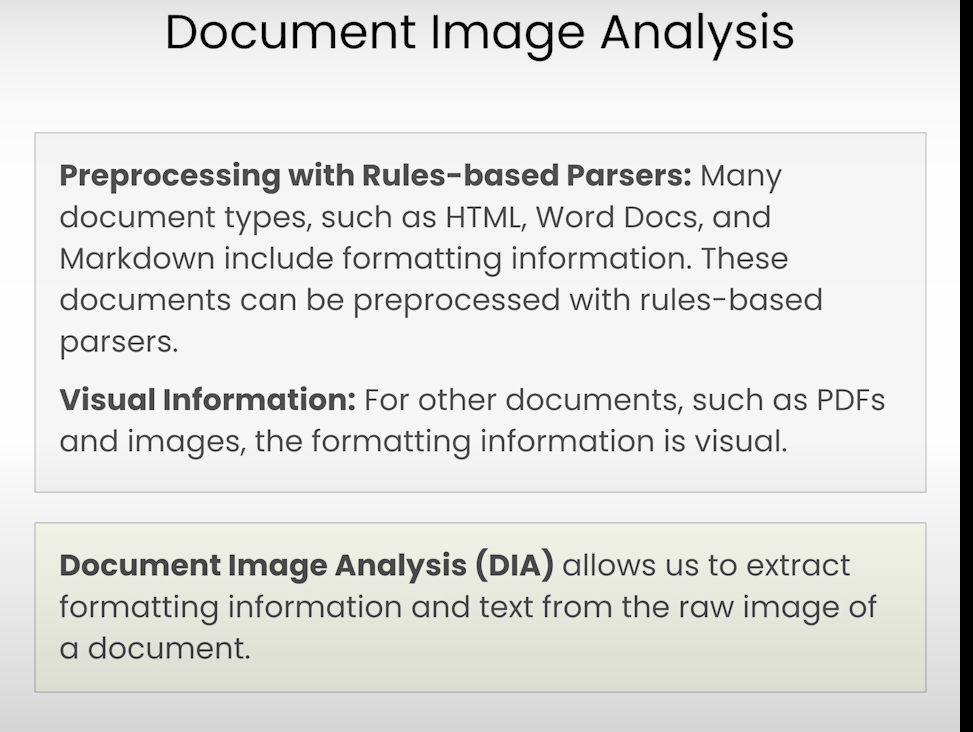

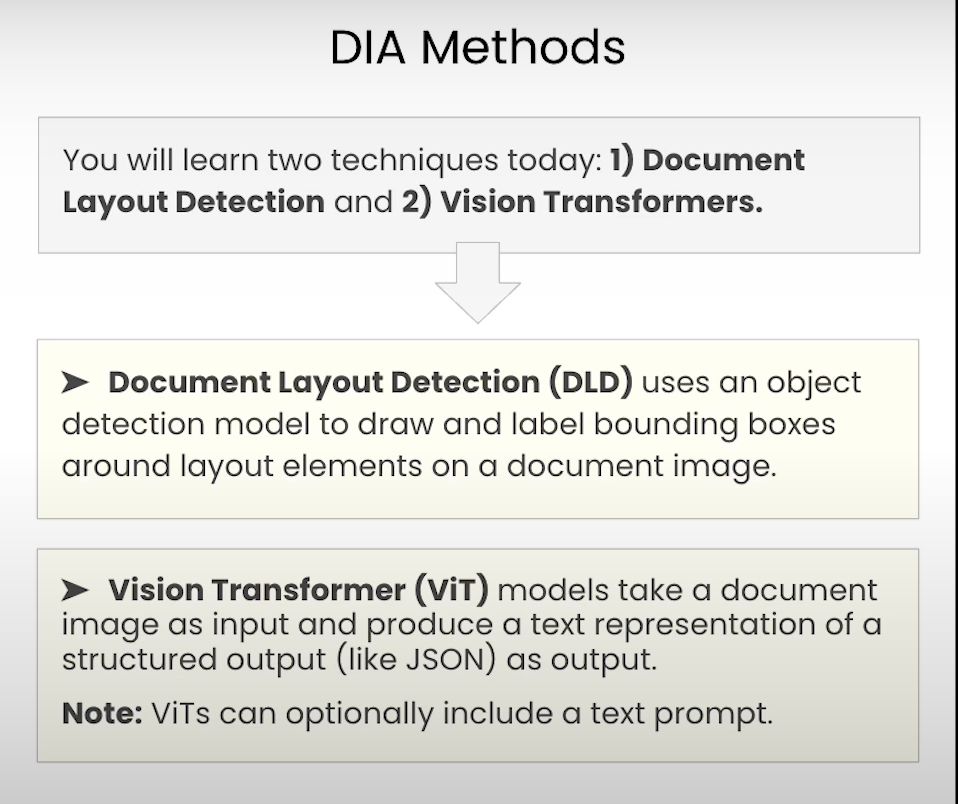

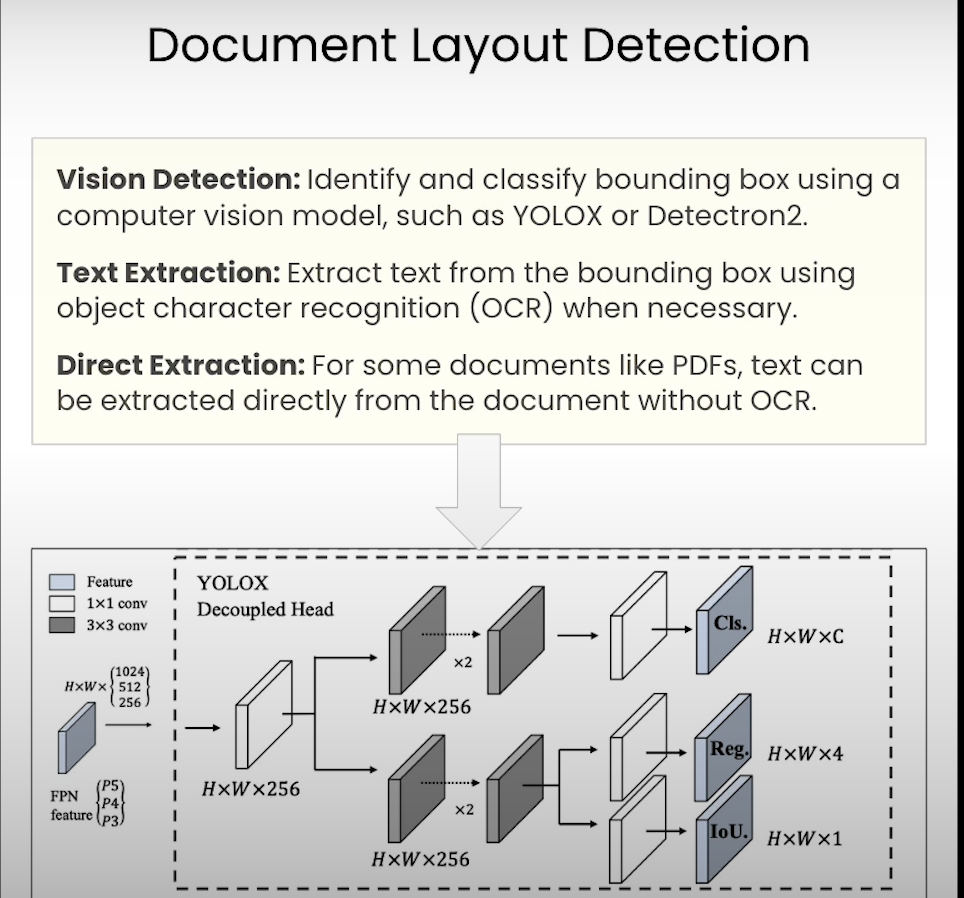

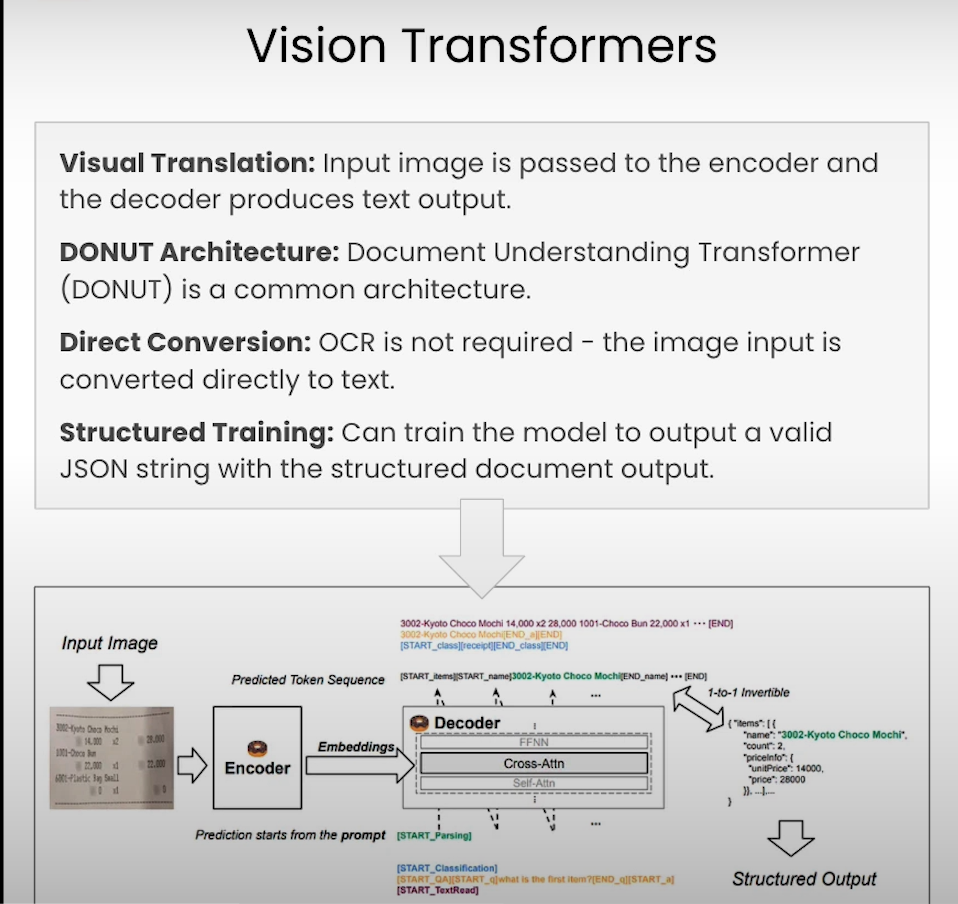

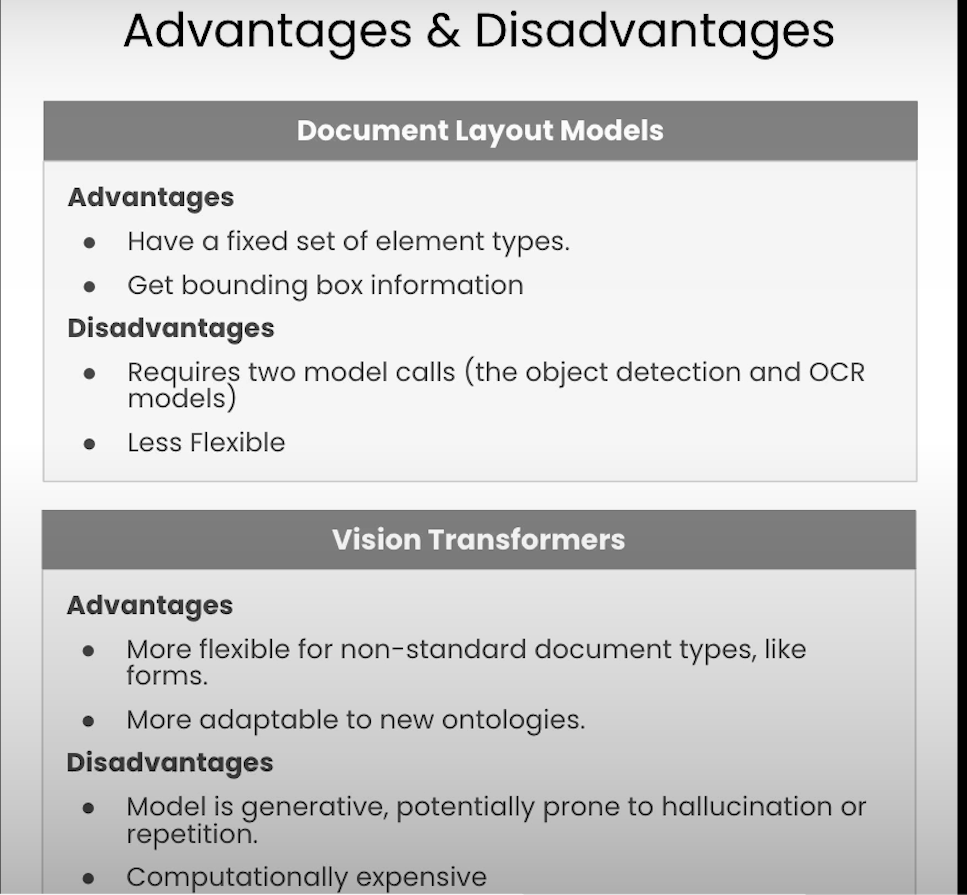

In [53]:
#Preprocessing PDFs and Images

In [1]:
# Warning control
import warnings
warnings.filterwarnings('ignore')

In [4]:
from unstructured_client import UnstructuredClient
from unstructured_client.models import shared
from unstructured_client.models.errors import SDKError

from unstructured.partition.html import partition_html
#from unstructured.partition.pdf import partition_pdf

from unstructured.staging.base import dict_to_elements

In [5]:
s = UnstructuredClient(
    api_key_auth="FVcWIC1fEbbJxmx98kLHUeLJFZFOPy"
    #server_url="YOUR_API_URL",
)

In [ ]:
#News in PDF and HTML¶


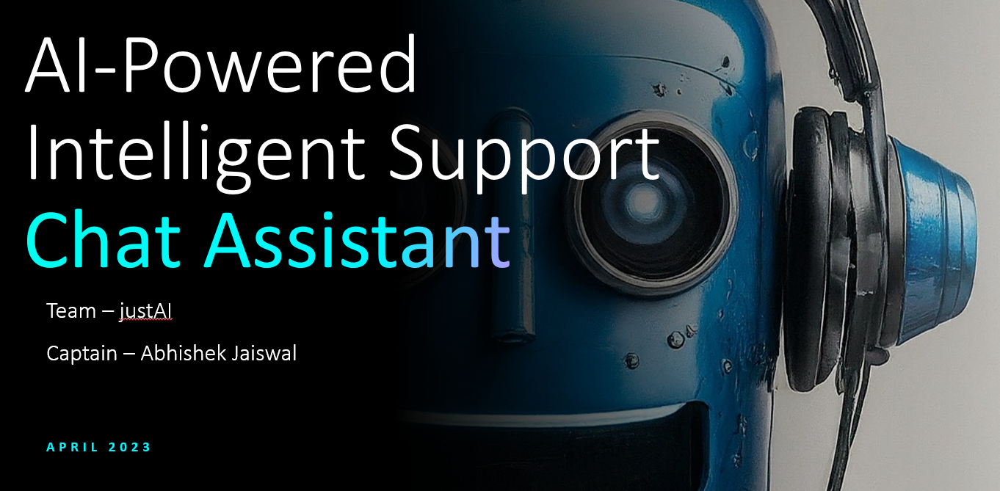

In [7]:
from IPython.display import Image
Image(filename="Data/image2.png", height=600, width=600) 

In [9]:
filename = "Data/N1_News.html"
html_elements = partition_html(filename=filename)

INFO: Reading document from string ...
INFO: Reading document ...


In [10]:
for element in html_elements[:10]:
    print(f"{element.category.upper()}: {element.text}")

TITLE: CNN
UNCATEGORIZEDTEXT: 1/30/2024
TITLE: A potent pair of atmospheric rivers will drench California as El NiÃ±o makes its first mark on winter
TITLE: By Mary Gilbert, CNN Meteorologist
UNCATEGORIZEDTEXT: Updated: 
        3:49 PM EST, Tue January 30, 2024
TITLE: Source: CNN
NARRATIVETEXT: A potent pair of atmospheric river-fueled storms are about to unleash a windy and incredibly wet week in California in what is the first clear sign of the influence El NiÃ±o was expected to have on the state this winter.
NARRATIVETEXT: The soaking storms will raise the flood threat across much of California into next week, but it appears the wet pattern is likely to continue well into February as a more typical El NiÃ±o pattern kicks into gear.
NARRATIVETEXT: El NiÃ±o — aÂ natural phenomenonÂ in the tropical Pacific that influences weather around the globe — causes changes in the jet stream that can point storms directly at California. Storms can also tap into an extra-potent supply of moisture 

In [ ]:
#Process the Document with Document Layout Detection
filename = "Data/el_nino.pdf"
pdf_elements = partition_pdf(filename=filename, strategy="fast")

In [ ]:
for element in pdf_elements[:10]:
    print(f"{element.category.upper()}: {element.text}")

In [ ]:
with open(filename, "rb") as f:
    files=shared.Files(
        content=f.read(),
        file_name=filename,
    )

req = shared.PartitionParameters(
    files=files,
    strategy="hi_res",
    hi_res_model_name="yolox",
)

try:
    resp = s.general.partition(req)
    dld_elements = dict_to_elements(resp.elements)
except SDKError as e:
    print(e)

In [ ]:
for element in dld_elements[:10]:
    print(f"{element.category.upper()}: {element.text}")

In [ ]:
import collections

In [ ]:
len(html_elements)

In [ ]:
html_categories = [el.category for el in html_elements]
collections.Counter(html_categories).most_common()

In [ ]:
len(dld_elements)

In [ ]:
dld_categories = [el.category for el in dld_elements]
collections.Counter(dld_categories).most_common()

# extracting-tables

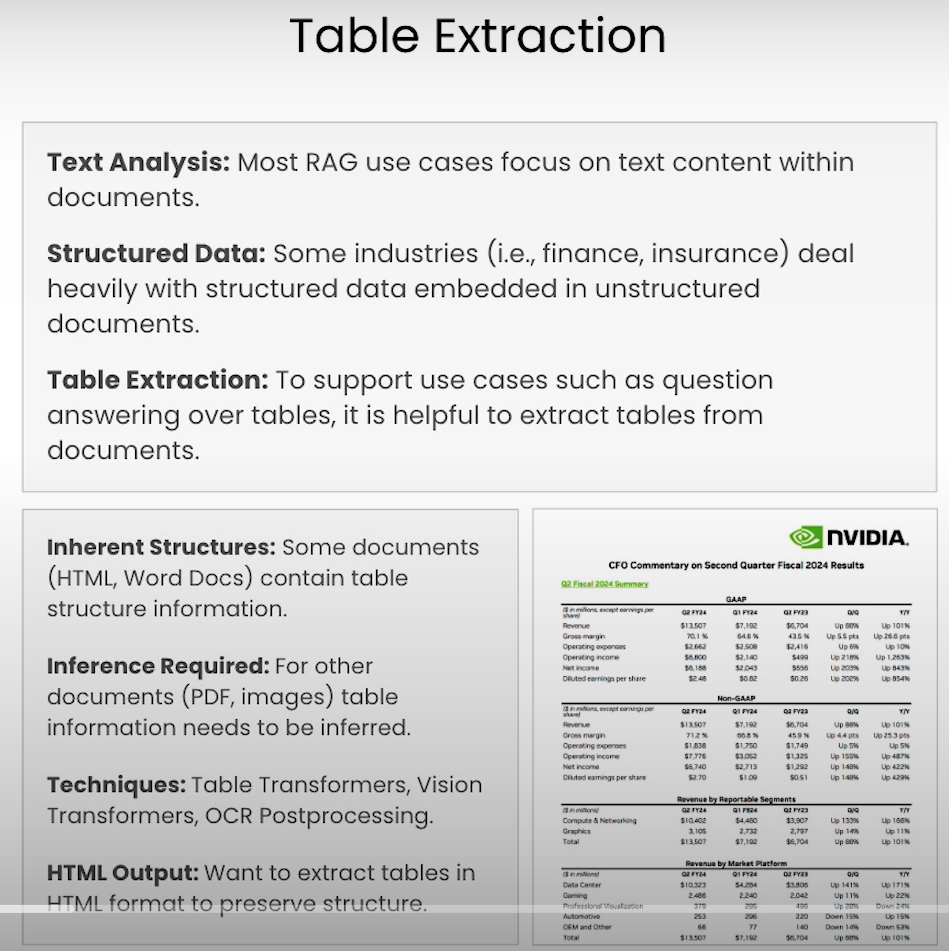

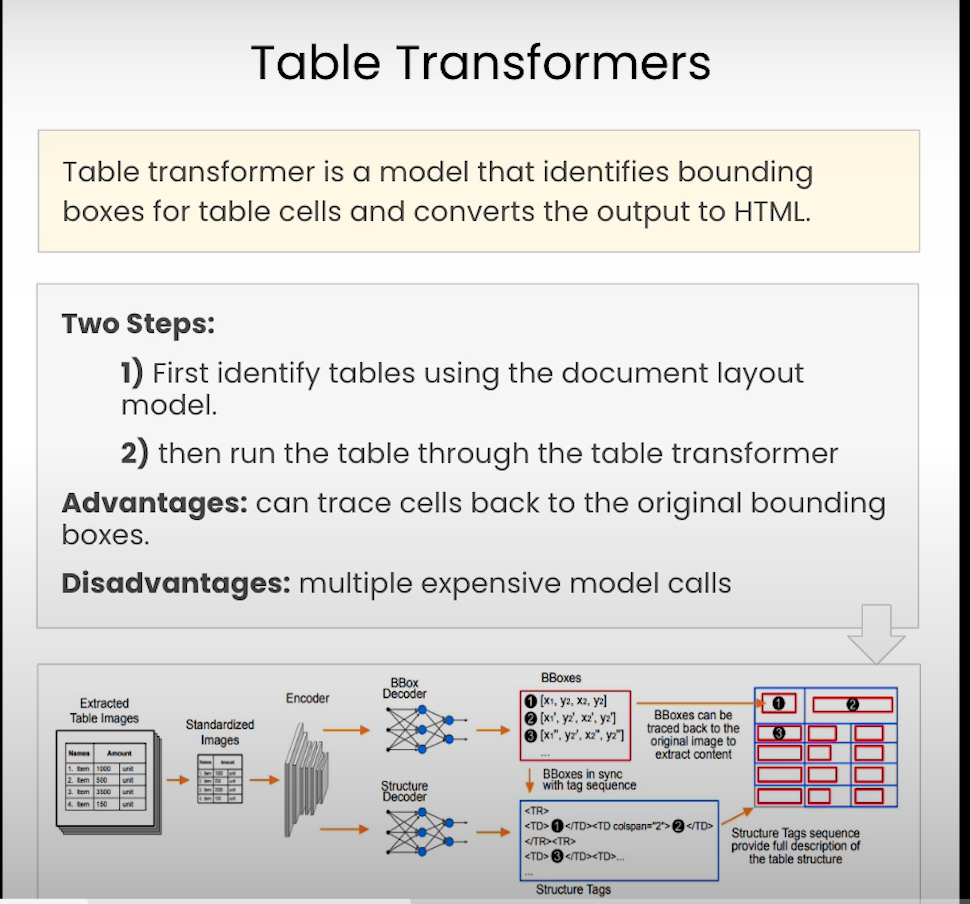

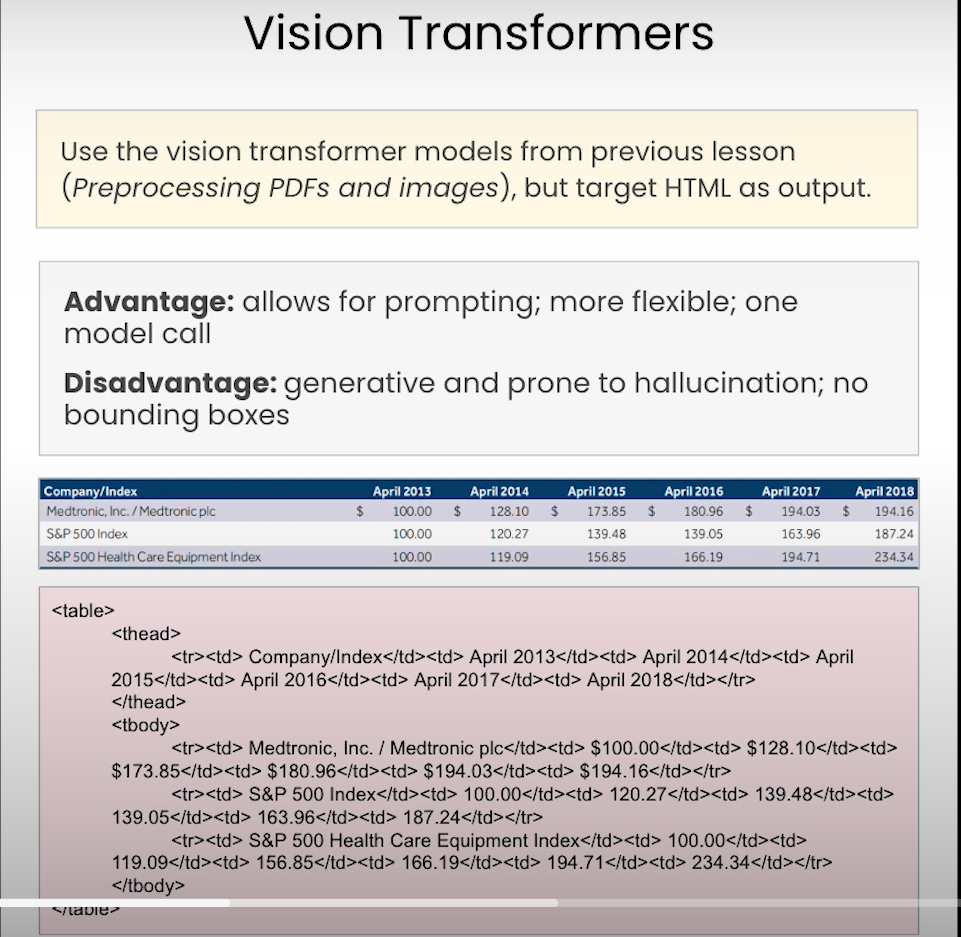

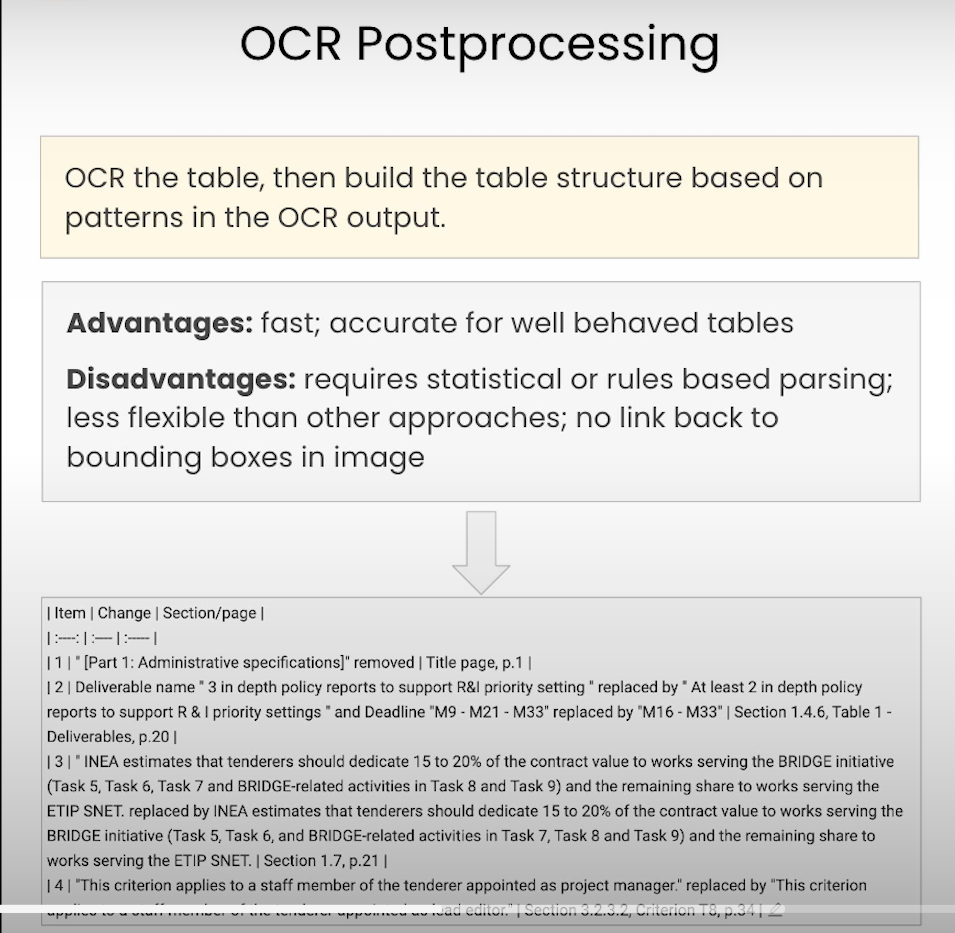

In [12]:
# Warning control
import warnings
warnings.filterwarnings('ignore')
from unstructured_client import UnstructuredClient
from unstructured_client.models import shared
from unstructured_client.models.errors import SDKError

from unstructured.staging.base import dict_to_elements

In [13]:
s = UnstructuredClient(
    api_key_auth="FVcWIC1fEbbJxmx98kLHUeLJFZFOPy"
    #server_url="YOUR_API_URL",
)

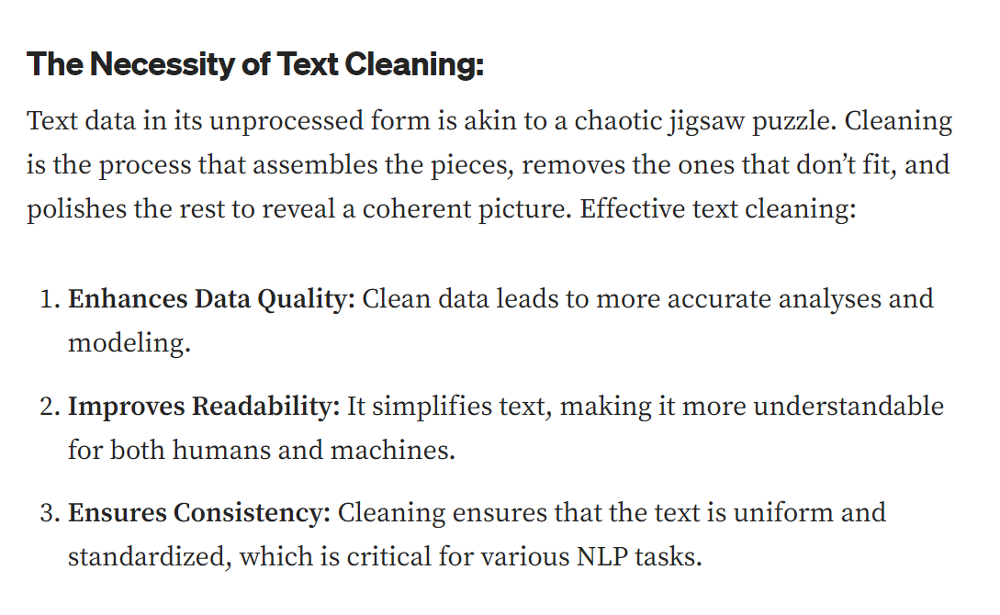

In [16]:
#Embedded Images and Tables
from IPython.display import Image
Image(filename="Data/image1.png", height=600, width=600) 

In [ ]:
filename = "Data/embedded-images-tables.pdf"

with open(filename, "rb") as f:
    files=shared.Files(
        content=f.read(),
        file_name=filename,
    )

req = shared.PartitionParameters(
    files=files,
    strategy="hi_res",
    hi_res_model_name="yolox",
    skip_infer_table_types=[],
    pdf_infer_table_structure=True,
)

try:
    resp = s.general.partition(req)
    elements = dict_to_elements(resp.elements)
except SDKError as e:
    print(e)

In [ ]:
tables = [el for el in elements if el.category == "Table"]

In [ ]:
tables[0].text

In [ ]:
table_html = tables[0].metadata.text_as_html

In [ ]:
from io import StringIO 
from lxml import etree

parser = etree.XMLParser(remove_blank_text=True)
file_obj = StringIO(table_html)
tree = etree.parse(file_obj, parser)
print(etree.tostring(tree, pretty_print=True).decode())

In [ ]:
from IPython.core.display import HTML
HTML(table_html)

In [ ]:
from langchain_openai import ChatOpenAI
from langchain_core.documents import Document
from langchain.chains.summarize import load_summarize_chain

In [ ]:
llm = ChatOpenAI(temperature=0, model_name="gpt-3.5-turbo-1106")
chain = load_summarize_chain(llm, chain_type="stuff")
chain.invoke([Document(page_content=table_html)])

# build-your-own-rag-bot

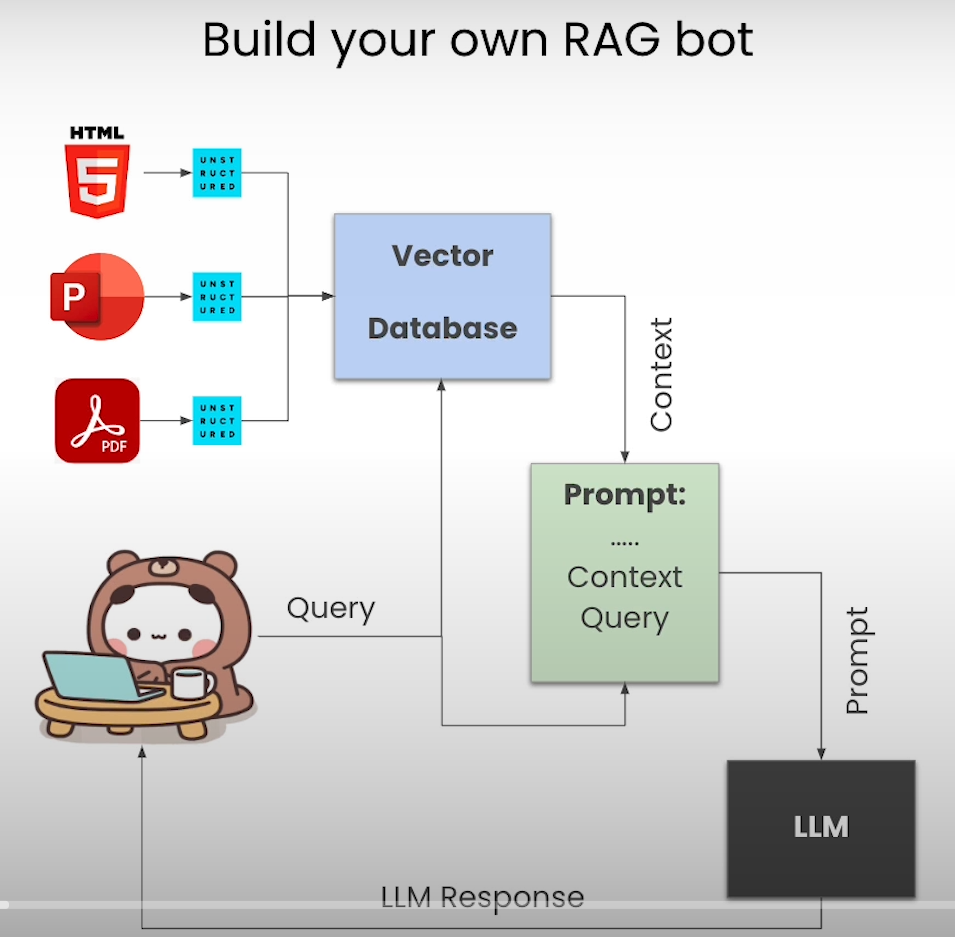